Note: You need data (all_city_data_with_pop.csv) and some images for the mapping at the end of this notebook. You define their paths on the cell below.


In [6]:
#@title File paths definition
FILE_PATH = "data/all_city_data_with_pop.csv"

ev_image_path = "map_data/ev.jpg"
restaurant_image_path = "map_data/restaurants.png"
park_image_path = "map_data/park.jpg"
school_image_path = "map_data/school.png"

In [2]:
#@title imports
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
import folium

In [7]:
#@title read csv

# dont add index column
df = pd.read_csv(FILE_PATH, index_col=0)
# remove parking_space because its already covered in "parking" column
df = df.drop(columns=['parking_space'])

### getting longitude and latitude from polygon

In [8]:
#@title Function : getting polygon centroid : longitude and latitude
# what we have : string : "POLYGON ((6.981833471527156 49.24179263859822, 6.982014735194567 49.237345764477745, 6.975276694899576 49.23722781871863, 6.975094827000435 49.24167467444893, 6.981833471527156 49.24179263859822))"
# what we want : polygon_vertices = [(lat1, lon1), (lat2, lon2), (lat3, lon3), (lat4, lon4), (lat5, lon5)]

def polygon_to_vertices(polygon):
    polygon = polygon.replace("POLYGON ((", "")
    polygon = polygon.replace("))", "")
    polygon = polygon.split(",")
    polygon_vertices = []
    for vertex in polygon:
        vertex = vertex.strip()
        lon, lat = vertex.split(" ")[0], vertex.split(" ")[1]
        polygon_vertices.append((float(lat), float(lon)))
    return polygon_vertices

def calculate_polygon_centroid(polygon_str):
    '''
    given the polygon string, calculate the centroid of the polygon.

    @args:
        polygon_str: string of the polygon
    @returns :
        centroid_lat: latitude of the centroid
        centroid_lon: longitude of the centroid
    '''

    vertices = polygon_to_vertices(polygon_str)
    total_lat = 0.0
    total_lon = 0.0

    num_vertices = len(vertices)

    for lon, lat in vertices:
        total_lon += lon
        total_lat += lat

    centroid_lat = total_lat / num_vertices
    centroid_lon = total_lon / num_vertices

    return (centroid_lat, centroid_lon)


In [28]:
#@title adding long,lat to each polygon/data point
df['longitude_latitude'] = df['geometry'].apply(lambda x: calculate_polygon_centroid(x))

In [30]:
#@title count how many entries are for each city

# get the city counts in a dictionary from df
city_counts = df['city'].value_counts().to_dict()
df_city = df.groupby('city')
# DataFrameGroupBy to dataframe
df_city = df_city.first()
# add a new column "city_counts" in df_city and put the values from city_counts. df_city is indexed by city
df_city['data_points'] = df_city.index.map(city_counts)


## EDA

In [11]:
#@title Variable definition

# divided the columns into 2 groups based on their type
cols1 = ['EV_stations', 'restaurant', 'park', 'school', 'Community_centre', 'place_of_worship', 'university', 'cinema',
       'library']

cols2 = ['residential' 'commercial' 'retail' 'townhall' 'government']


cols_infra_long_stay = ["EV_stations", "school", "university", "cinema", "library","residential", "commercial", "retail", "townhall"]
COLS_ENTERTAINMENT_LOCS = ["restaurant", "park", "school","place_of_worship", "cinema", "library"]

PUBLIC_PLACES = ['EV_stations', 'restaurant', 'park', 'school', 'Community_centre', 'place_of_worship', 'university', 'cinema',
'library', 'residential' 'commercial' 'retail' 'townhall' 'government']


In [12]:
#@title Plot: Correlation of EV_stations to other variables
fig = px.bar(df.corr()['EV_stations'].drop('EV_stations').sort_values(ascending=False), title="Correlation of EV_stations to other variables")
fig.show()


<ipython-input-12-e6cfbd97d955>:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  fig = px.bar(df.corr()['EV_stations'].drop('EV_stations').sort_values(ascending=False), title="Correlation of EV_stations to other variables")


In [25]:
#@title Number of data points / polygons we have on each city
fig = px.bar(df_city, x=df_city.index, y='data_points', color='data_points', color_continuous_scale='Bluered_r', title="Number of data points per city")
fig.show()


In [13]:
#@title Plot : Proportion of Infrastructure in the whole data

# Calculate the total counts for each column
total_counts = df[cols_infra_long_stay].sum()

# Create a DataFrame for the pie chart data
data = {'Infrastructure': cols_infra_long_stay, 'Count': total_counts}
df_pie = pd.DataFrame(data)

# Plot the pie chart
fig = px.pie(df_pie, values='Count', names='Infrastructure', title='Proportion of Infrastructure in the whole data')
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.show()

In [14]:
#@title Plot: Number of EV stations per city

df_city_sum = df.copy()

df_city_sum = df_city_sum.groupby(['city']).sum()

df_city_sum = df_city_sum.sort_values(by=['EV_stations'], ascending=False)
fig = px.bar(df_city_sum, x=df_city_sum.index, y='EV_stations', color='EV_stations', color_continuous_scale='Bluered_r', title="Number of EV stations per city")
fig.show()

df_city_sum = df_city_sum.reset_index()



<ipython-input-14-c97094af3f62>:5: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.



In [16]:
#@title Plot : Count of different types of places in each city
fig = px.bar(df_city_sum, x='city', y=cols1, barmode='group', color_discrete_sequence=px.colors.qualitative.Pastel, title="Count of different types of places in each city")
fig.show()


In [17]:
#@title Plot: Number of EV stations vs Number of parking per city
fig = px.scatter(df_city_sum, x='EV_stations', y='parking', color='city', color_continuous_scale='Bluered_r', title="Number of EV stations vs Number of parking per city")
fig.update_traces(marker={'size': 15})
fig.show()

In [18]:
#@title Plot: Number of EV stations vs Number of restaurants per city
fig = px.scatter(df_city_sum, x='EV_stations', y='restaurant', color='city', color_continuous_scale='Bluered_r', title="Number of EV stations vs Number of restaurants per city")
fig.update_traces(marker={'size': 15})
fig.show()

In [19]:
#@title Plot: Number of different types of infrastructure in Saarbrucken

city_name = "Saarbrucken"
# get the row of berlin
df_sb = df_city_sum[df_city_sum['city'] == city_name]

# get the values of the columns in cols_infra_long_stay
city_long_stay_counts = df_sb[cols_infra_long_stay]

fig = px.pie(city_long_stay_counts, values=city_long_stay_counts.values.flatten(), names=city_long_stay_counts.columns, title="Number of different types of infrastructure in "+ city_name)
fig.show()

In [20]:
#@title Plot: Number of different types of infrastructure in Berlin

city_name = "Berlin"

# get the row of berlin
df_berlin = df_city_sum[df_city_sum['city'] == city_name]

# get the values of the columns in cols_infra_long_stay
city_long_stay_counts = df_berlin[cols_infra_long_stay]

fig = px.pie(city_long_stay_counts, values=city_long_stay_counts.values.flatten(), names=city_long_stay_counts.columns, title="Number of different types of infrastructure in "+ city_name)
fig.show()

In [21]:
#@title Plot: Number of different types of infrastructure in Munich

city_name = "Munich"
# get the row of berlin
df_munich = df_city_sum[df_city_sum['city'] == city_name]

# get the values of the columns in cols_infra_long_stay
city_long_stay_counts = df_munich[cols_infra_long_stay]

fig = px.pie(city_long_stay_counts, values=city_long_stay_counts.values.flatten(), names=city_long_stay_counts.columns, title="Number of different types of infrastructure in "+ city_name)
fig.show()

In [26]:
#@title Plot: Number of different types of infrastructure in Stuttgart

city_name = "Stuttgart"
# get the row of berlin
df_stuttgart = df_city_sum[df_city_sum['city'] == city_name]

# get the values of the columns in cols_infra_long_stay
city_long_stay_counts = df_stuttgart[cols_infra_long_stay]

fig = px.pie(city_long_stay_counts, values=city_long_stay_counts.values.flatten(), names=city_long_stay_counts.columns, title="Number of different types of infrastructure in "+ city_name)
fig.show()

# Mapping Saarbrucken

In [38]:
#@title variable definitions
df_sb = df[df['city'] == "Saarbrucken"]


In [34]:
#@title get the mean of the longitudes and latitudes
longitudes = df_sb['longitude_latitude'].apply(lambda x: x[1])
latitudes = df_sb['longitude_latitude'].apply(lambda x: x[0])
map_center = (longitudes.mean(), latitudes.mean())

In [36]:
#@title mapping and putting the markers

# you can also add other markers to the map. just go through the comments below and you will get it

map = folium.Map(location=map_center, zoom_start=12)

# Iterate over the DataFrame rows and add markers for EV stations
for index, row in df_sb.iterrows():
    ev_lon, ev_lat = row['longitude_latitude']

    school_count = row['school']
    ev_count = row['EV_stations']
    restaurant_count = row['restaurant']
    park_count = row['park']
    #get more counts here if you want

    if school_count != 0:
        # add schools
        icon = folium.CustomIcon(school_image_path, icon_size=(20, 20))
        marker = folium.Marker(
            location=[ev_lat, ev_lon],
            icon=icon,
            popup=f"Schools: {school_count}"
        )
        marker.add_to(map)
        ev_lat += 0.001 # adding so the next marker is not on top of it

    if ev_count != 0:
        # add ev stations
        icon = folium.CustomIcon(ev_image_path, icon_size=(20, 20))
        marker = folium.Marker(
            location=[ev_lat, ev_lon],
            icon=icon,
            popup=f"EV Stations: {ev_count}"
        )
        marker.add_to(map)
        ev_lat += 0.001 # adding so the next marker is not on top of it

    if restaurant_count != 0:
        # add restaurants
        icon = folium.CustomIcon(restaurant_image_path, icon_size=(20, 20))
        marker = folium.Marker(
            location=[ev_lat, ev_lon],
            icon=icon,
            popup=f"Restaurants: {restaurant_count}"
        )
        marker.add_to(map)
        ev_lat += 0.001 # adding so the next marker is not on top of it


    if park_count != 0:
        # add parks
        icon = folium.CustomIcon(park_image_path, icon_size=(20, 20))
        marker = folium.Marker(
            location=[ev_lat, ev_lon],
            icon=icon,
            popup=f"Parks: {park_count}"
        )
        marker.add_to(map)
        ev_lat += 0.001 # adding so the next marker is not on top of it

    # repeast similar if conditions for other features if you want

# Save the map as an HTML file
map.save('ev_stations_map.html')


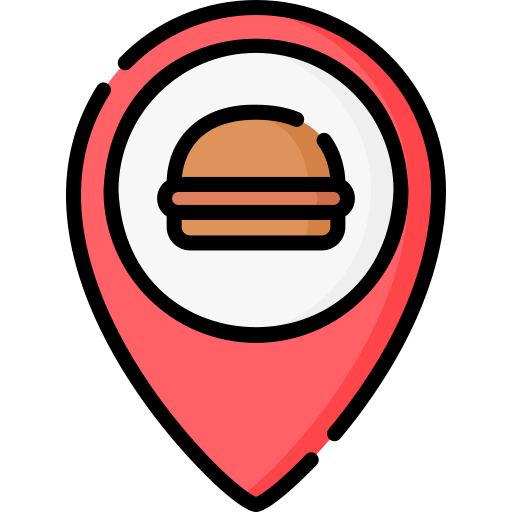
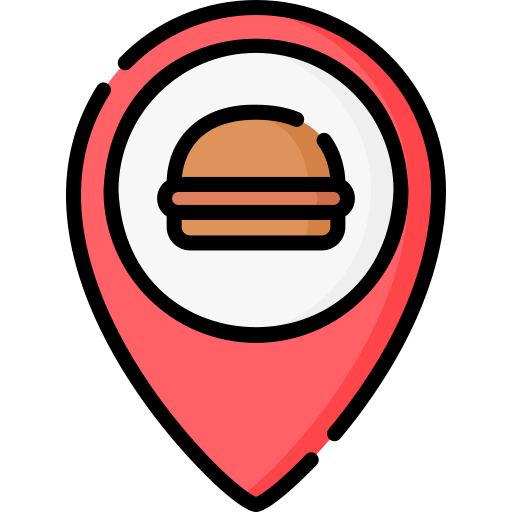
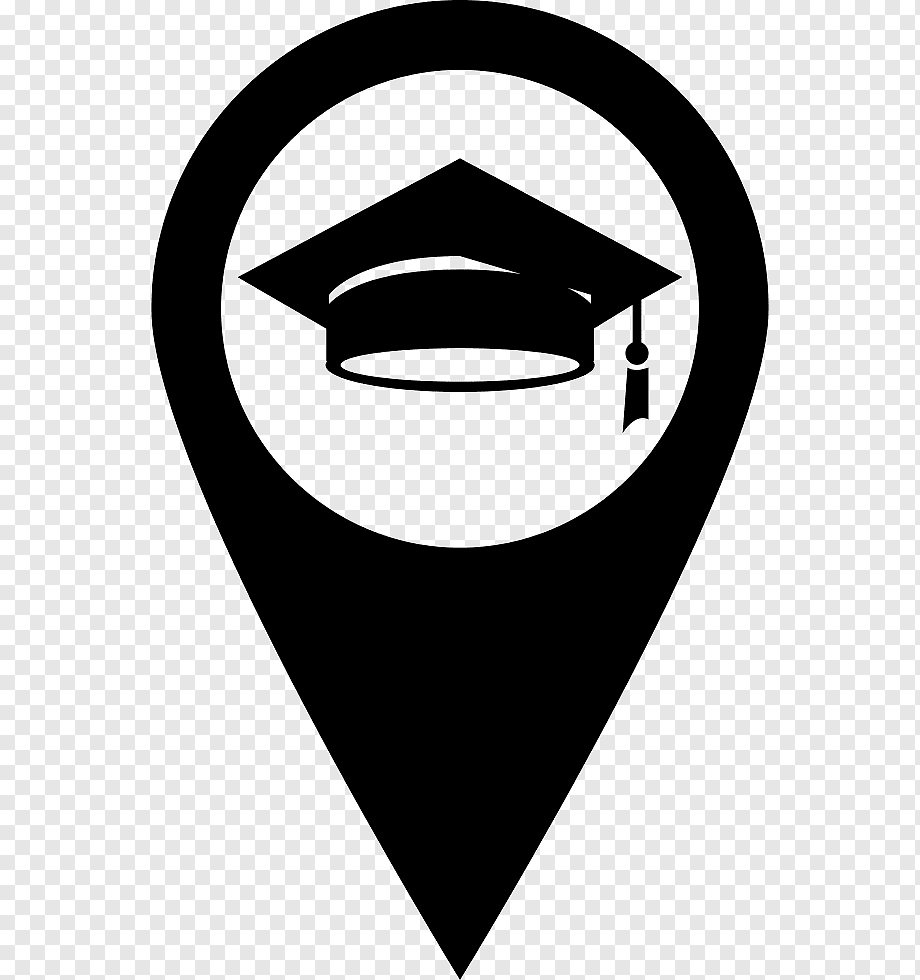
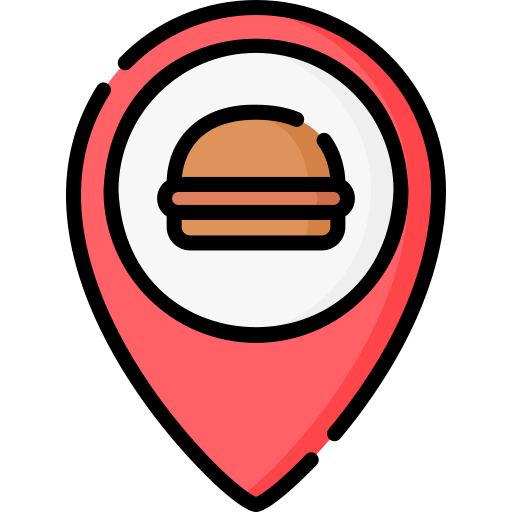
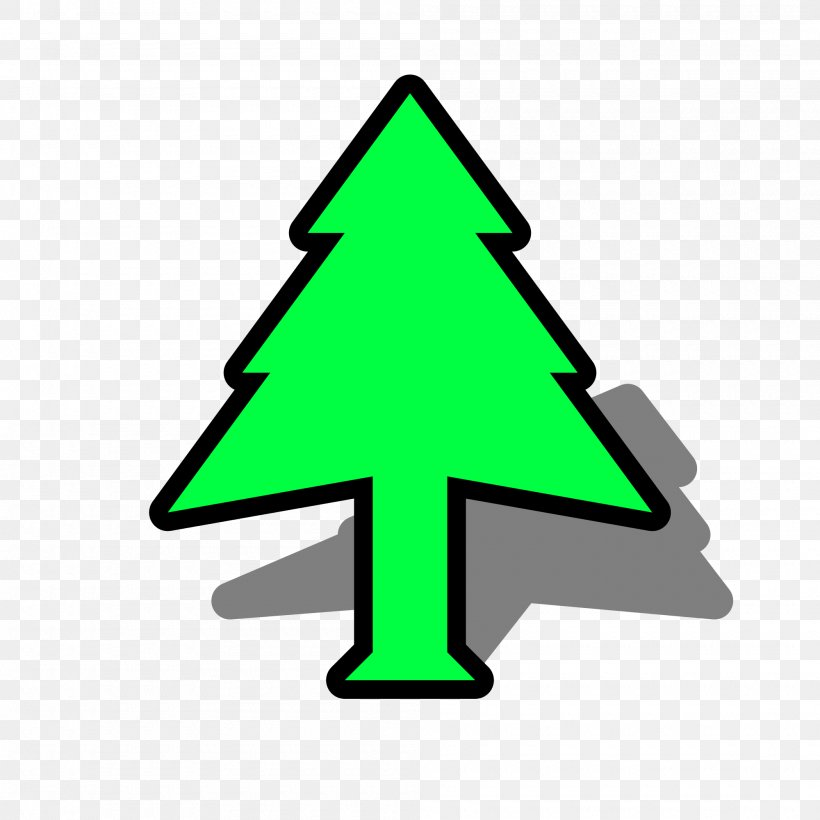
...
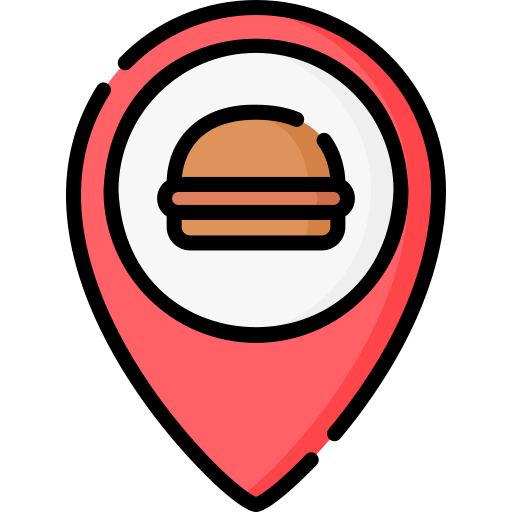
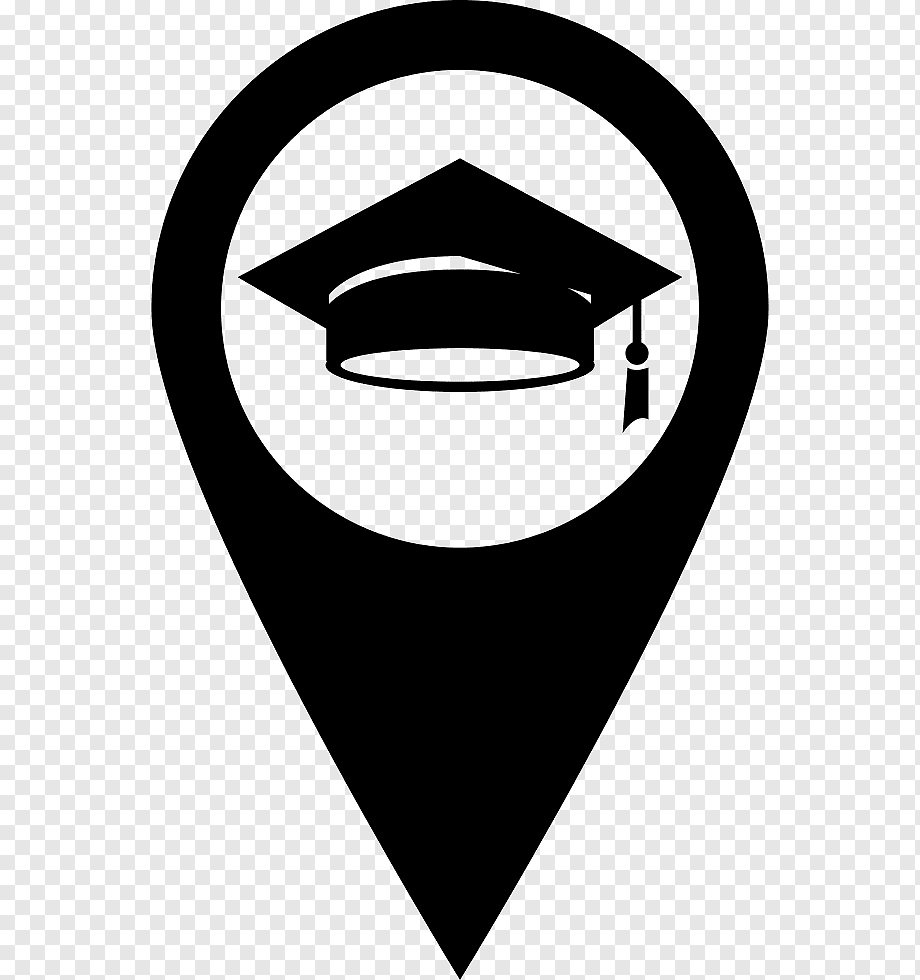
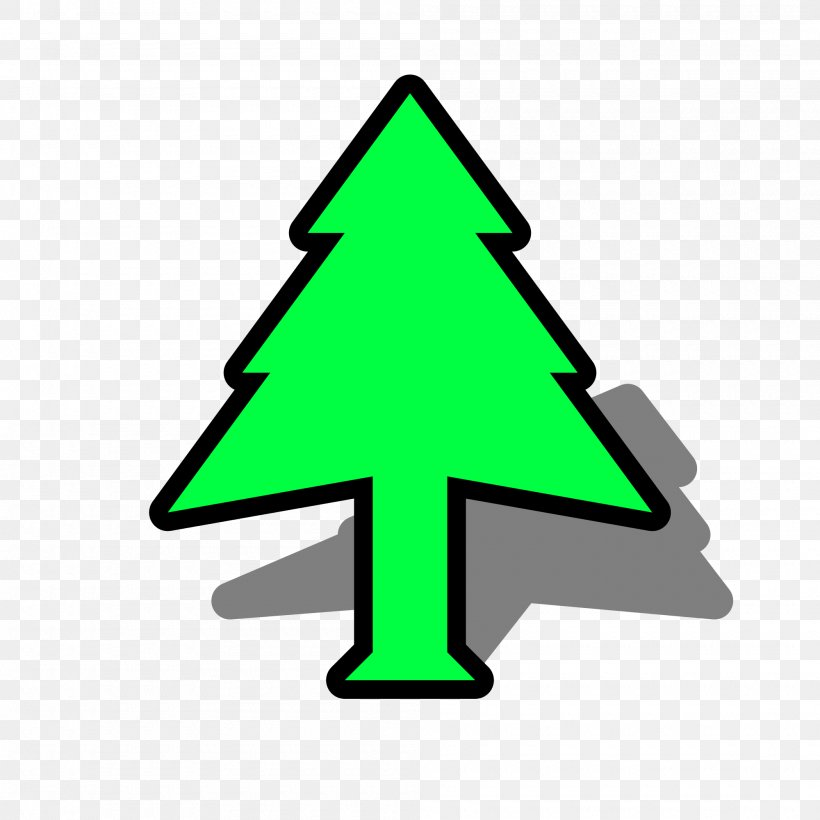
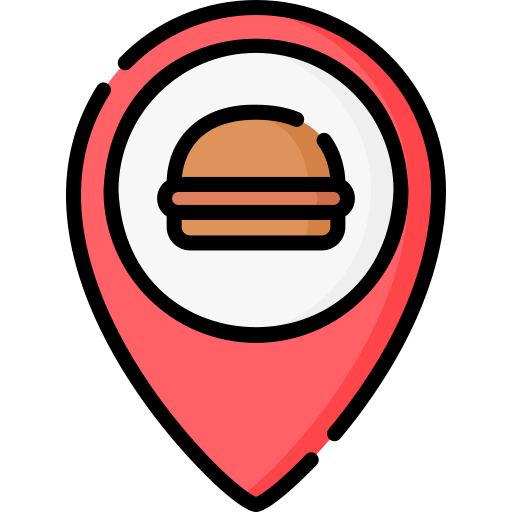
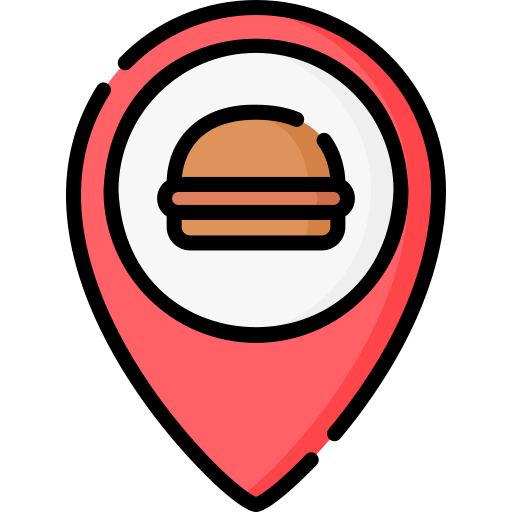

In [37]:
map